In [1]:
import requests
from io import StringIO as sio
import pandas as pd
import numpy as np
import itertools
import baltic as bt
import datetime
from collections import Counter

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import cm
from matplotlib.patches import Ellipse
from matplotlib.colors import to_hex, ListedColormap
import seaborn as sns
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

In [2]:
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter, LongitudeLocator, LatitudeLocator
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import numpy as np
import matplotlib.ticker as mticker

In [5]:
bt.calendarDate(2022.175, '%Y-%m-%d'), bt.calendarDate(2022.0677, '%Y-%m-%d'), bt.calendarDate(2022.2466, '%Y-%m-%d')

('2022-03-05', '2022-01-25', '2022-04-01')

In [93]:
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

plt.style.use('plot_style.txt')

In [3]:
# plt.rcParams['figure.facecolor'] = '#FFFFFF'
# plt.rcParams['figure.dpi'] = 300

# plt.rcParams['lines.linewidth'] = 0.5
# plt.rcParams['axes.linewidth'] = 0.5

# plt.rcParams['xtick.labelsize'] = 4.5
# plt.rcParams['xtick.major.size'] = 1.5
# plt.rcParams['xtick.major.width'] = 0.5
# plt.rcParams['xtick.minor.width'] = 0.5
# plt.rcParams['xtick.major.pad'] = 2

# plt.rcParams['ytick.labelsize'] = 4.5
# plt.rcParams['ytick.major.size'] = 1.5
# plt.rcParams['ytick.minor.size'] = 1
# plt.rcParams['ytick.major.width'] = 0.5
# plt.rcParams['ytick.major.pad'] = 1

In [4]:
# * read genotype file
genotype = pd.read_csv('./genotype.csv', sep='\t', index_col=9)

# * read metadata file
metainfo = pd.read_csv('./dataset2_metainfo.csv', sep='\t', index_col=0)[['Isolate_Name', 'Subtype', 'Host', 'host2', 'Collection_Date', 'Region', 'Country', 'Province', 'Subregion', 'Latitude', 'Longitude']]
metainfo = metainfo.join(genotype['group'])
metainfo['Collection_Date2'] = pd.to_datetime(metainfo['Collection_Date'])
metainfo['Collection_Date3'] = metainfo['Collection_Date2'].map(lambda x: x.to_period('M'))

group_map = {
    '1_1_1_1_1_1_1_1': 'G1noR', '2_2_1_1_2_1_1_1': 'G1R1', '3_2_2_1_2_1_1_2': 'G1R2', '1_1_1_1_2_1_1_1': 'G1R3', '3_5_1_1_2_1_1_1': 'G1other', '3_1_2_1_2_1_1_1': 'G1other', 
    '0_0_0_0_0_0_0_0': 'G0noR', '4_2_3_0_3_2_0_0': 'G0R1', '0_0_5_0_0_0_0_0': 'G0other', '5_4_4_0_4_0_3_3': 'G0other', '6_3_6_0_5_0_2_4': 'G0other'
}

metainfo['group2'] = metainfo['group'].map(group_map)
metainfo = metainfo.fillna(' ')

In [11]:
beast_map = {'1_1_1_1_1_1_1_1': {'PB2':'1_1_1_1_1_1_1_1', 'PB1':'1_1_1_1_1_1_1_1', 'PA':'1_1_1_1_1_1_1_1', 'HA':'1_1_1_1_1_1_1_1', 'NP':'1_1_1_1_1_1_1_1', 'NA':'1_1_1_1_1_1_1_1', 'MP':'1_1_1_1_1_1_1_1', 'NS':'1_1_1_1_1_1_1_1', },
             '0_0_0_0_0_0_0_0': {'PB2':'0_0_0_0_0_0_0_0', 'PB1':'0_0_0_0_0_0_0_0', 'PA':'0_0_0_0_0_0_0_0', 'HA':'0_0_0_0_0_0_0_0', 'NP':'0_0_0_0_0_0_0_0', 'NA':'0_0_0_0_0_0_0_0', 'MP':'0_0_0_0_0_0_0_0', 'NS':'0_0_0_0_0_0_0_0', },
             '4_2_3_0_3_2_0_0': {'PB2':'4_2_3_0_3_2_0_0', 'PB1':'4_2_3_0_3_2_0_0', 'PA':'4_2_3_0_3_2_0_0', 'HA':'0_0_0_0_0_0_0_0', 'NP':'4_2_3_0_3_2_0_0', 'NA':'4_2_3_0_3_2_0_0', 'MP':'0_0_0_0_0_0_0_0', 'NS':'0_0_0_0_0_0_0_0', },
             '2_2_1_1_2_1_1_1': {'PB2':'2_2_1_1_2_1_1_1', 'PB1':'2_2_1_1_2_1_1_1', 'PA':'1_1_1_1_1_1_1_1', 'HA':'1_1_1_1_1_1_1_1', 'NP':'2_2_1_1_2_1_1_1', 'NA':'1_1_1_1_1_1_1_1', 'MP':'1_1_1_1_1_1_1_1', 'NS':'1_1_1_1_1_1_1_1', },
             '3_2_2_1_2_1_1_2': {'PB2':'3_2_2_1_2_1_1_2', 'PB1':'2_2_1_1_2_1_1_1', 'PA':'3_2_2_1_2_1_1_2', 'HA':'1_1_1_1_1_1_1_1', 'NP':'2_2_1_1_2_1_1_1', 'NA':'1_1_1_1_1_1_1_1', 'MP':'1_1_1_1_1_1_1_1', 'NS':'3_2_2_1_2_1_1_2', },
             '1_1_1_1_2_1_1_1': {'PB2':'1_1_1_1_1_1_1_1', 'PB1':'1_1_1_1_1_1_1_1', 'PA':'1_1_1_1_1_1_1_1', 'HA':'1_1_1_1_1_1_1_1', 'NP':'2_2_1_1_2_1_1_1', 'NA':'1_1_1_1_1_1_1_1', 'MP':'1_1_1_1_1_1_1_1', 'NS':'1_1_1_1_1_1_1_1', }}

# host_l = ['Waterfowl', 'Wild-gal', 'Dom-ans', 'Dom-gal', 'Seabird', 'Other']
# host_color = ['#d12743', '#f7b395', '#ee9d30', '#ecce3f', '#a4cee4', 'gray']
host_set = ['Waterfowl', 'Wild-gal', 'Dom-ans', 'Dom-gal', 'Seabird', 'Other']
host_color = ['#832316', '#e4b897', '#ca613d', '#e8c555', '#3C5488', '#878b9f']
host_cmap = dict(zip(host_set, host_color))

seg_l = ['PB2', 'PB1', 'PA', 'HA', 'NP', 'NA', 'MP', 'NS']
color_seg = ['#BC3C29', '#0072B5', '#E18727', '#20854E', '#7876B1', '#FFDC91', '#EE4C97', '#6F99AD']

In [109]:
group_l = ['G1', 'G1R1', 'G1R2', 'G1R3', 'G1other', 'G0', 'G0R1', 'G0other']
color_l = ['#832316', '#ca613d', '#e8c555', '#e4b897', '#878b9f', '#3C5488', '#a9b8a2', '#878b9f']
group_cmap = dict(zip(group_l, color_l))

# Begin

In [12]:
import importlib
importlib.reload(bt)

<module 'baltic' from '/home/zeng/DulabWork/H5N8_evolution/data_201910_202108/baltic.py'>

In [13]:
def parse_mcc_tree(treeFile, acc_interest):
    mcctree = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
    mcctree.sortBranches(descending=True)

    mst_acc = max([(l.name, l.height) for l in mcctree.getExternal()], key=lambda x: x[1])[0]
    mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
    mcctree.setAbsoluteTime3(mst)

    acc_intersection = [l for l in mcctree.getExternal() if l.name in acc_interest]
    if len(acc_intersection) == 1:
        mrca = acc_intersection[0].parent
    else:
        mrca = mcctree.commonAncestor(acc_intersection)
    gmrca = mrca.parent

    res = []
    for mrca in [mrca, gmrca]:
        try:
            height_m = mrca.traits['height_median']
            height_u, height_l = mrca.traits['height_95%_HPD']
        except KeyError:
            height_m, height_u, height_l = [mrca.traits['height']] * 3
        date_m = datetime.datetime.strptime(bt.calendarDate(mst - height_m), '%Y-%m-%d')
        date_u = datetime.datetime.strptime(bt.calendarDate(mst - height_u), '%Y-%m-%d')
        date_l = datetime.datetime.strptime(bt.calendarDate(mst - height_l), '%Y-%m-%d')

        host_prob_dict = dict(zip(mrca.traits['host2.set'], mrca.traits['host2.set.prob']))
        host_prob = [host_prob_dict.get(host, 0) for host in host_set]
        res.append([date_m, date_l, date_u] + host_prob)

    return res

# get ancestor status for a given group
def parse_mcc_tree_set(treeFile, acc_interest):

    tree_set = bt.loadNexus2(treeFile, variableDate=True, absoluteTime=False, verbose=False)

    loc_l, gloc_l = [], []
    for tree in tree_set:
        tree.sortBranches(descending=True)

        acc_intersection = [l for l in tree.getExternal() if l.name in acc_interest]
        if len(acc_intersection) == 1:
            mrca = acc_intersection[0].parent
        else:
            mrca = tree.commonAncestor(acc_intersection)
        gmrca = mrca.parent

        loc_l.append(mrca.traits['loc'])
        gloc_l.append(gmrca.traits['loc'])

    return loc_l, gloc_l

In [193]:
def draw_host_estimation(ax, anster_est, **kwargs):
    for i in range(0, 8):
        seg = seg_l[i]
        s = 2 * i

        tmp = anster_est.loc[seg, (host_set, )].unstack(0).T.applymap(lambda x: float(x))[['mrcga', 'mrca']]
        data = tmp
        data_cum = data.cumsum(axis=0)
        width = 0.5

        for i, colname in enumerate(host_set):
            heights = data.iloc[i, :]
            starts = data_cum.iloc[i, :] - heights
            ax.bar([s-width/2], heights[0], bottom=starts[0], width=.5, label=colname, facecolor=host_cmap[colname], linewidth=0, alpha=0.7)
            ax.bar([s+width/2], heights[1], bottom=starts[1], width=.5, label=colname, facecolor=host_cmap[colname], linewidth=0, alpha=0.9)
    
    patches = []
    for color, seg in zip(host_color, host_set):
        patches.append(mpatches.Patch(color=color, label=seg, linewidth=0))
    plt.legend(loc='lower left', bbox_to_anchor=(0, 1.01), handles=patches, frameon=False, ncol=4, fontsize=6, borderaxespad=0.)

    ax.grid(which='major', axis='y', linestyle='--', color='grey', alpha=0.4, linewidth=.5)

    for spine in plt.gca().spines.keys():
        if spine == "top" or spine == "right" or spine == "left":
            plt.gca().spines[spine].set_color("none")

    ax.set_xlim(-1, 15.5)
    ax.set_xlabel('Segment', **kwargs)
    ax.set_ylabel('Probability', **kwargs)
    plt.xticks(np.arange(0, 16, 2), seg_l)


# def sub_i(ax, seg, s, anster_est):
#     tmp = anster_est.loc[seg, (host_set, )].unstack(0).T.applymap(lambda x: float(x))[['mrcga', 'mrca']]
#     data = tmp
#     data_cum = data.cumsum(axis=0)
#     width = 0.5

#     x = []
#     for i in range(s, s+2):
#         x = x + [i-width/2, i, i+width/2]

#     d = data.values.tolist()
#     d2 = []
#     for i in range(6):
#         y = []
#         for j in range(2):
#             y = y + np.repeat(d[i][j], 3).tolist()
#         d2.append(y)

#     ax.stackplot(x, d2, labels=host_set, colors=host_color, alpha=0.6, linewidth=0)

#     for i, colname in enumerate(host_set):
#         heights = data.iloc[i, :]
#         starts = data_cum.iloc[i, :] - heights
#         ax.bar([s, s+1], heights, bottom=starts, width=0.5, label=colname, facecolor=host_cmap[colname], linewidth=0, alpha=0.8)
# #         ax.bar([s, s+1], heights, bottom=starts, width=0.5, label=colname, facecolor=host_cmap[colname], linewidth=0, alpha=0.8)


# def draw_host_estimation(ax, anster_est, **kwargs):
#     for i in range(0, 8):
#         sub_i(ax, seg_l[i], 2 * i, anster_est)

#     patches = []
#     for color, seg in zip(host_color, host_set):
#         patches.append(mpatches.Patch(color=color, label=seg, linewidth=0))
#     plt.legend(loc='lower left', bbox_to_anchor=(0, 1.01), handles=patches, frameon=False, ncol=4, fontsize=6, borderaxespad=0.)

#     ax.grid(which='major', axis='y', linestyle='--', color='grey', alpha=0.4, linewidth=.5)

#     for spine in plt.gca().spines.keys():
#         if spine == "top" or spine == "right" or spine == "left":
#             plt.gca().spines[spine].set_color("none")

#     ax.set_xlim(-0.5, 15.5)
#     ax.set_xlabel('Segment', **kwargs)
#     ax.set_ylabel('Probability', **kwargs)
#     plt.xticks(np.arange(0.5, 16.5, 2), seg_l)


def draw_time_estimation(ax, anster_est, **kwargs):
    ax.vlines(x=range(0, 16, 2), ymin=anster_est.loc[seg_l, ('height_l', 'mrcga')], ymax=anster_est.loc[seg_l, ('height_u', 'mrcga')], colors=color_seg, linestyle='dashed', lw=2, alpha=.6)
    ax.vlines(x=range(1, 17, 2), ymin=anster_est.loc[seg_l, ('height_l', 'mrca')], ymax=anster_est.loc[seg_l, ('height_u', 'mrca')], colors=color_seg, lw=2)

    ax.scatter(x=range(0, 16, 2), y=anster_est.loc[seg_l, ('height_m', 'mrcga')], edgecolors=color_seg, marker='o', c='white', s=10, lw=1, alpha=.6)
    ax.scatter(x=range(1, 17, 2), y=anster_est.loc[seg_l, ('height_m', 'mrca')], edgecolors=color_seg, c=color_seg, s=10)

#     t_ = anster_est.loc[seg_l, ('height_m', 'mrca')].idxmax()
#     t_ = anster_est.loc[t_, (['height_m', 'height_l', 'height_u'], 'mrca')].values
#     ax.axhline(y=t_[0], color='dimgrey', lw=.5)
#     ax.axhline(y=t_[1], linestyle='--', color='dimgrey', lw=.5)
#     ax.axhline(y=t_[2], linestyle='--', color='dimgrey', lw=.5)

#     t_ = anster_est.loc[seg_l, ('height_m', 'mrcga')].idxmax()
#     t_ = anster_est.loc[t_, (['height_m', 'height_l', 'height_u'], 'mrcga')].values
#     ax.axhline(y=t_[0], color='dimgrey', lw=.5)
#     ax.axhline(y=t_[1], linestyle='--', color='dimgrey', lw=.5)
#     ax.axhline(y=t_[2], linestyle='--', color='dimgrey', lw=.5)

    ax.grid(which='major', axis='y', linestyle='--', linewidth='0.5', color='grey', alpha=0.4)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.set_xlabel('Segment', **kwargs)
    ax.set_ylabel('Time', **kwargs)

    plt.xticks(np.arange(0.5, 15.5, 2), labels=seg_l)


def draw_single_seg_map(ax, seg, values, color, extent=(-20, 160, -30, 90), step=(30, 30)):
    
    ax.add_feature(cfeature.COASTLINE.with_scale('10m'), lw=0.3)
    ax.add_feature(cfeature.OCEAN, facecolor='lightgrey')

    ax.set_extent(extent, crs=proj)
    gl = ax.gridlines(crs=proj, draw_labels=True, linewidth=.3, color='gray', alpha=0.5, linestyle='--', dms=True)
    gl.top_labels = False
    gl.right_labels = False
    
    gl.xlocator = mticker.FixedLocator([0, 45, 90, 135, 180])
    gl.ylocator = LatitudeLocator()
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
    
    gl.xlabel_style = {'size': 6}
    gl.ylabel_style = {'size': 6}    

    
#     ax.set_xticks(np.arange(extent[0], extent[1] + step[0], step[0]), crs=proj)
#     ax.set_yticks(np.arange(extent[2], extent[3] + step[1], step[1]), crs=proj)
#     ax.tick_params(axis='x', labelrotation=15)

#     # 利用Formatter格式化刻度标签
#     ax.xaxis.set_major_formatter(LongitudeFormatter())
#     ax.yaxis.set_major_formatter(LatitudeFormatter())

#     plt.grid(which='major', linestyle='--', linewidth=0.5, alpha=0.5)
#     ax.set_extent(extent, crs=proj)
    ax.set_title(seg, fontsize=6)

    loc_l, gloc_l = values
    long, lat = zip(*loc_l)
    glong, glat = zip(*gloc_l)

    ax.annotate('', xy=(np.median(lat), np.median(long)), xytext=(np.median(glat), np.median(glong)), transform=proj, arrowprops=dict(arrowstyle='fancy', connectionstyle="arc3,rad=0.2", alpha=0.6, shrinkB=5, linewidth=0.5, color=color))
    sns.kdeplot(x=lat, y=long, fill=True, thresh=0.2, ax=ax, transform=proj, alpha=.6, color=color)
    sns.kdeplot(x=glat, y=glong, fill=False, thresh=0.2, ax=ax, transform=proj, levels=2, alpha=.6, linewidths=1, color=color)
       

In [15]:
group = "1_1_1_1_1_1_1_1"
_group = group.replace('_', '')

df_l = pd.DataFrame()
loc_estimation_G1 = {}
for seg in seg_l:
    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
    acc_of_group = metainfo.query('group == @group').index.to_list()

    t = pd.DataFrame(parse_mcc_tree(treeFile, acc_of_group), columns=['height_m', 'height_l', 'height_u'] + host_set, index=[[seg, seg], ['mrca', 'mrcga']])
    df_l = df_l.append(t)

    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'
    loc_estimation_G1[seg] = parse_mcc_tree_set(treeFile, acc_of_group)

anster_est_G1 = df_l.unstack(1).reindex(seg_l)
anster_est_G1

height_m              height_l              height_u             \
          mrca      mrcga       mrca      mrcga       mrca      mrcga   
PB2 2019-09-19 2018-11-16 2019-06-19 2018-04-06 2019-11-19 2019-04-23   
PB1 2019-08-19 2018-05-25 2019-05-04 2018-02-03 2019-11-03 2018-09-18   
PA  2019-10-14 2018-12-19 2019-08-31 2018-07-09 2019-11-19 2019-03-31   
HA  2019-09-28 2019-03-05 2019-07-30 2018-11-27 2019-11-17 2019-05-17   
NP  2019-10-22 2018-06-10 2019-08-20 2018-03-07 2019-11-29 2018-08-14   
NA  2019-09-14 2018-11-05 2019-07-03 2018-06-09 2019-11-18 2019-03-14   
MP  2019-09-07 2018-12-30 2019-05-04 2018-05-23 2019-11-21 2019-05-22   
NS  2019-09-19 2019-02-03 2019-06-04 2018-05-14 2019-11-28 2019-06-05   

    Waterfowl           Wild-gal             Dom-ans             Dom-gal  \
         mrca     mrcga     mrca     mrcga      mrca     mrcga      mrca   
PB2  0.050000  0.063333      0.0  0.003333  0.423333  0.286667  0.516667   
PB1  0.073333  0.651163      0.0  0.000000  0.280000  0.186047  0.636667   
PA   0.076667  0.143333      0.0  0.003333  0.526667  0.276667  0.396667   
HA   0.016667  0.040000      0.0  0.000000  0.330000  0.223333  0.640000   
NP   0.083333  0.451087      0.0  0.000000  0.456667  0.500000  0.460000   
NA   0.040000  0.070000      0.0  0.000000  0.436667  0.216667  0.456667   
MP   0.026667  0.073333      0.0  0.000000  0.346667  0.180000  0.623333   
NS   0.176667  0.126667      0.0  0.013333  0.406667  0.273333  0.413333   

              Seabird               Other            
        mrcga    mrca     mrcga      mrca     mrcga  
PB2  0.536667     0.0  0.003333  0.010000  0.106667  
PB1  0.116279     0.0  0.000000  0.010000  0.046512  
PA   0.503333     0.0  0.000000  0.000000  0.073333  
HA   0.600000     0.0  0.000000  0.013333  0.136667  
NP   0.048913     0.0  0.000000  0.000000  0.000000  
NA   0.550000     0.0  0.003333  0.066667  0.160000  
MP   0.720000     0.0  0.000000  0.003333  0.026667  
NS   0.526667     0.0  0.000000  0.003333  0.060000

Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)


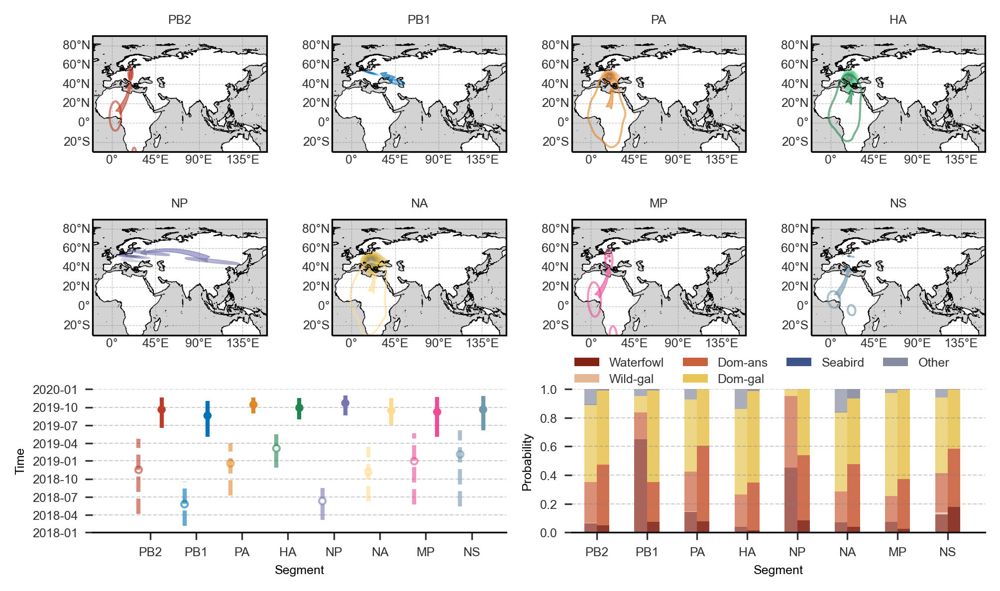

In [208]:
group = "1_1_1_1_1_1_1_1"

fig = plt.figure(figsize=(6.75, 4.), constrained_layout=False, dpi=300)
gs = fig.add_gridspec(3, 4)
proj = ccrs.PlateCarree()

for i, seg in enumerate(seg_l):
    ax = fig.add_subplot(gs[i // 4, i % 4], projection=proj)
    draw_single_seg_map(ax, seg, loc_estimation_G1[seg], color_seg[i], extent=(-20, 160, -30, 90), step=(30, 30))

ax9 = fig.add_subplot(gs[2, 0:2])
draw_time_estimation(ax9, anster_est_G1, fontsize=6)

ax10 = fig.add_subplot(gs[2, 2:4])
draw_host_estimation(ax10, anster_est_G1, fontsize=6)

# fig.suptitle('Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)', style='italic', weight='bold', fontsize=8)
print('Most Recent Common Ancestor Estimation for %s (%s)' % (group_map[group], group))

# plt.subplots_adjust(hspace=0.1, wspace=0.4, top=0.95, left=0.1, right=0.95, bottom=0.1)
plt.tight_layout()
plt.savefig(f'./results/G0.pdf', dpi=300)

plt.show()

***Fig. 2 Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)***

In [17]:
group = "0_0_0_0_0_0_0_0"
_group = group.replace('_', '')

df_l = pd.DataFrame()
loc_estimation_G0 = {}
for seg in seg_l:
    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
    acc_of_group = metainfo.query('group == @group').index.to_list()

    t = pd.DataFrame(parse_mcc_tree(treeFile, acc_of_group), columns=['height_m', 'height_l', 'height_u'] + host_set, index=[[seg, seg], ['mrca', 'mrcga']])
    df_l = df_l.append(t)

    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'
    loc_estimation_G0[seg] = parse_mcc_tree_set(treeFile, acc_of_group)

anster_est_G0 = df_l.unstack(1).reindex(seg_l)
anster_est_G0

height_m              height_l              height_u             \
          mrca      mrcga       mrca      mrcga       mrca      mrcga   
PB2 2019-10-04 2017-06-21 2019-02-21 2016-12-09 2020-02-13 2017-12-23   
PB1 2019-11-06 2017-04-08 2019-06-04 2017-01-19 2020-02-23 2017-11-28   
PA  2019-09-27 2017-05-24 2019-04-14 2016-11-26 2020-02-19 2017-10-28   
HA  2019-11-08 2017-03-05 2019-06-28 2016-12-10 2020-02-26 2017-05-02   
NP  2019-07-02 2018-05-11 2018-11-27 2017-05-28 2020-01-04 2018-11-14   
NA  2019-09-22 2017-01-30 2019-02-01 2016-10-02 2020-02-16 2017-04-24   
MP  2019-09-20 2017-11-09 2019-03-28 2017-03-16 2020-01-28 2018-07-06   
NS  2019-10-17 2018-02-09 2019-05-23 2017-11-04 2020-02-28 2018-04-26   

    Waterfowl            Wild-gal             Dom-ans             Dom-gal  \
         mrca     mrcga      mrca     mrcga      mrca     mrcga      mrca   
PB2  0.075658  0.225650  0.000667  0.000355  0.271192  0.108156  0.648372   
PB1  0.242306  0.116272  0.000555  0.000296  0.217198  0.560651  0.534718   
PA   0.122209  0.136416  0.000333  0.000114  0.210865  0.173858  0.664482   
HA   0.219753  0.144317  0.000667  0.000000  0.151650  0.025886  0.617931   
NP   0.133652  0.112013  0.001000  0.000000  0.308521  0.258117  0.552050   
NA   0.089879  0.277877  0.000333  0.000223  0.338185  0.042793  0.562382   
MP   0.349517  0.320628  0.000000  0.000000  0.070214  0.427740  0.577936   
NS   0.231308  0.021004  0.000111  0.000000  0.018998  0.001007  0.748028   

                Seabird               Other            
        mrcga      mrca     mrcga      mrca     mrcga  
PB2  0.660165  0.000667  0.000591  0.003444  0.005083  
PB1  0.319231  0.000333  0.000000  0.004888  0.003550  
PA   0.688470  0.000555  0.000342  0.001555  0.000799  
HA   0.818576  0.000333  0.000000  0.009666  0.011221  
NP   0.627706  0.000778  0.000541  0.004000  0.001623  
NA   0.676313  0.000667  0.000112  0.008555  0.002682  
MP   0.249515  0.000333  0.000706  0.002000  0.001412  
NS   0.977989  0.000667  0.000000  0.000889  0.000000

Most Recent Common Ancestor Estimation for G0noR (0_0_0_0_0_0_0_0)


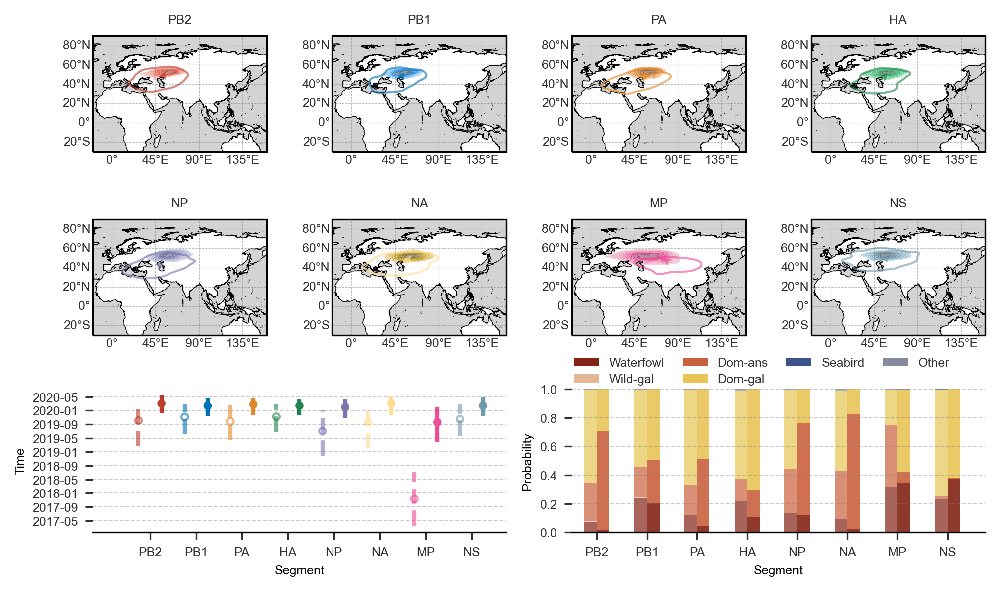

In [209]:
group = "0_0_0_0_0_0_0_0"

fig = plt.figure(figsize=(6.75, 4.), constrained_layout=False, dpi=300)
gs = fig.add_gridspec(3, 4)
proj = ccrs.PlateCarree()

for i, seg in enumerate(seg_l):
    ax = fig.add_subplot(gs[i // 4, i % 4], projection=proj)
    draw_single_seg_map(ax, seg, loc_estimation_G0[seg], color_seg[i], extent=(-20, 160, -30, 90), step=(30, 30))


ax9 = fig.add_subplot(gs[2, 0:2])
draw_time_estimation(ax9, anster_est_G0, fontsize=6)

ax10 = fig.add_subplot(gs[2, 2:4])
draw_host_estimation(ax10, anster_est_G0, fontsize=6)

# fig.suptitle('Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)', style='italic', weight='bold', fontsize=8)
print('Most Recent Common Ancestor Estimation for %s (%s)' % (group_map[group], group))

# plt.subplots_adjust(hspace=0.1, wspace=0.4, top=0.95, left=0.1, right=0.95, bottom=0.1)

plt.tight_layout()
plt.savefig(f'./results/G1.pdf', dpi=300)
plt.show()

***Fig. 3 Most Recent Common Ancestor Estimation for G0noR (0_0_0_0_0_0_0_0)***

In [210]:
group = "0_0_0_0_0_0_0_0"
_group = group.replace('_', '')

df_l = pd.DataFrame()
loc_estimation_G0 = {}
for seg in seg_l:
    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
    acc_of_group = metainfo.query('group == @group').index.to_list()

    acc_of_group.remove('EPI_ISL_623074')

    t = pd.DataFrame(parse_mcc_tree(treeFile, acc_of_group), columns=['height_m', 'height_l', 'height_u'] + host_set, index=[[seg, seg], ['mrca', 'mrcga']])
    df_l = df_l.append(t)

    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'
    loc_estimation_G0[seg] = parse_mcc_tree_set(treeFile, acc_of_group)

anster_est_G0 = df_l.unstack(1).reindex(seg_l)
anster_est_G0

height_m              height_l              height_u             \
          mrca      mrcga       mrca      mrcga       mrca      mrcga   
PB2 2020-03-03 2019-10-04 2019-12-06 2019-02-21 2020-05-13 2020-02-13   
PB1 2020-02-11 2019-11-06 2019-11-17 2019-06-04 2020-04-16 2020-02-23   
PA  2020-02-25 2019-09-27 2019-11-26 2019-04-14 2020-04-22 2020-02-19   
HA  2020-02-13 2019-11-08 2019-11-25 2019-06-28 2020-04-14 2020-02-26   
NP  2020-02-01 2019-07-02 2019-10-30 2018-11-27 2020-04-11 2020-01-04   
NA  2020-03-03 2019-09-22 2019-11-25 2019-02-01 2020-05-06 2020-02-16   
MP  2019-09-20 2017-11-09 2019-03-28 2017-03-16 2020-01-28 2018-07-06   
NS  2020-02-13 2019-10-17 2019-11-12 2019-05-23 2020-04-26 2020-02-28   

    Waterfowl            Wild-gal             Dom-ans             Dom-gal  \
         mrca     mrcga      mrca     mrcga      mrca     mrcga      mrca   
PB2  0.016332  0.075658  0.000000  0.000667  0.690923  0.271192  0.292634   
PB1  0.206977  0.242306  0.000000  0.000555  0.296967  0.217198  0.495834   
PA   0.042773  0.122209  0.000000  0.000333  0.472614  0.210865  0.484613   
HA   0.108099  0.219753  0.000000  0.000667  0.188424  0.151650  0.702811   
NP   0.121098  0.133652  0.000111  0.001000  0.642929  0.308521  0.235863   
NA   0.023109  0.089879  0.000000  0.000333  0.804799  0.338185  0.171314   
MP   0.349517  0.320628  0.000000  0.000000  0.070214  0.427740  0.577936   
NS   0.375958  0.231308  0.000000  0.000111  0.006777  0.018998  0.617043   

                Seabird               Other            
        mrcga      mrca     mrcga      mrca     mrcga  
PB2  0.648372  0.000000  0.000667  0.000111  0.003444  
PB1  0.534718  0.000000  0.000333  0.000222  0.004888  
PA   0.664482  0.000000  0.000555  0.000000  0.001555  
HA   0.617931  0.000000  0.000333  0.000667  0.009666  
NP   0.552050  0.000000  0.000778  0.000000  0.004000  
NA   0.562382  0.000000  0.000667  0.000778  0.008555  
MP   0.249515  0.000333  0.000706  0.002000  0.001412  
NS   0.748028  0.000000  0.000667  0.000222  0.000889

Most Recent Common Ancestor Estimation for G0noR (0_0_0_0_0_0_0_0)


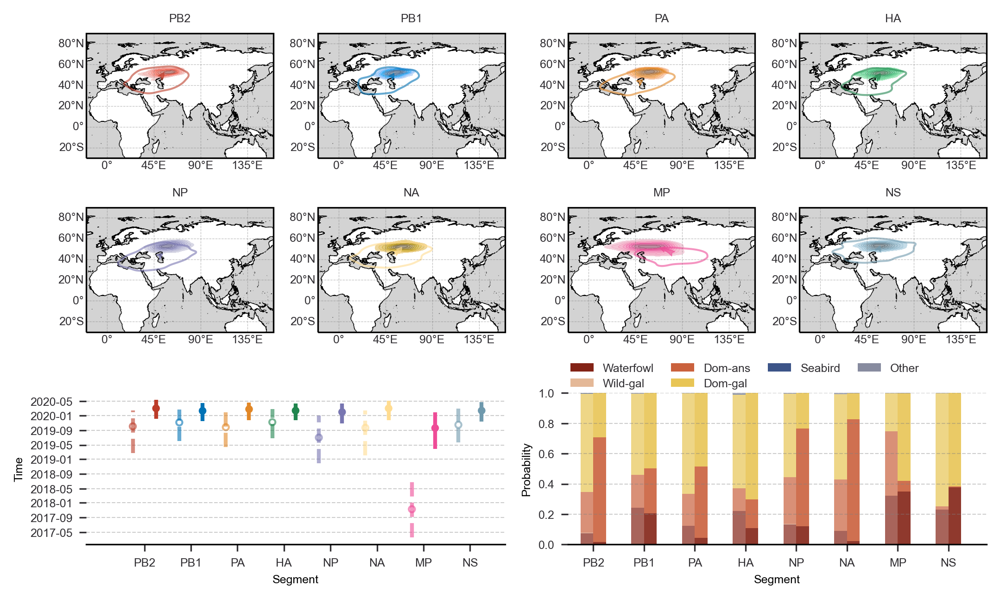

In [211]:
fig = plt.figure(figsize=(7.08, 4.2), constrained_layout=True, dpi=300)
gs = fig.add_gridspec(3, 4)
proj = ccrs.PlateCarree()

for i, seg in enumerate(seg_l):
    ax = fig.add_subplot(gs[i // 4, i % 4], projection=proj)
    draw_single_seg_map(ax, seg, loc_estimation_G0[seg], color_seg[i], extent=(-20, 160, -30, 90), step=(30, 30))

ax9 = fig.add_subplot(gs[2, 0:2])
draw_time_estimation(ax9, anster_est_G0, fontsize=6)

ax10 = fig.add_subplot(gs[2, 2:4])
draw_host_estimation(ax10, anster_est_G0, fontsize=6)


# fig.suptitle('Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)', style='italic', weight='bold', fontsize=8)
print('Most Recent Common Ancestor Estimation for %s (%s)' % (group_map[group], group))

plt.savefig(f'/home/zeng/Desktop/h5n8_minor/G0_except_Iraq.jpg', dpi=300)

plt.show()

## adjust for minor group

In [212]:
group = "2_2_1_1_2_1_1_1"
_group = group.replace('_', '')

df_l = pd.DataFrame()
loc_estimation_G1R1 = {}
for seg in seg_l:
    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
    acc_of_group = metainfo.query('group == @group').index.to_list()

    t = pd.DataFrame(parse_mcc_tree(treeFile, acc_of_group), columns=['height_m', 'height_l', 'height_u'] + host_set, index=[[seg, seg], ['mrca', 'mrcga']])
    df_l = df_l.append(t)

    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'
    loc_estimation_G1R1[seg] = parse_mcc_tree_set(treeFile, acc_of_group)

anster_est_G1R1 = df_l.unstack(1).reindex(seg_l)
anster_est_G1R1

height_m              height_l              height_u             \
          mrca      mrcga       mrca      mrcga       mrca      mrcga   
PB2 2020-07-27 2015-10-14 2019-10-26 2015-03-11 2020-11-08 2015-12-26   
PB1 2019-07-30 2018-06-21 2018-04-25 2017-03-08 2020-07-18 2019-11-17   
PA  2020-11-01 2020-09-01 2020-10-14 2020-08-27 2020-11-15 2020-10-05   
HA  2020-09-11 2020-08-27 2020-07-27 2020-07-27 2020-10-04 2020-09-28   
NP  2020-10-04 2020-08-11 2020-08-02 2020-05-07 2020-11-13 2020-10-22   
NA  2020-09-03 2020-07-27 2020-08-27 2020-05-28 2020-09-04 2020-09-17   
MP  2020-11-02 2020-10-18 2020-10-06 2020-09-14 2020-11-19 2020-11-10   
NS  2020-10-21 2020-10-16 2020-09-19 2020-09-20 2020-11-02 2020-11-05   

    Waterfowl            Wild-gal             Dom-ans             Dom-gal  \
         mrca     mrcga      mrca     mrcga      mrca     mrcga      mrca   
PB2  0.996334  0.996112  0.001000  0.002111  0.001778  0.000333  0.000778   
PB1  0.587712  0.550828  0.001778  0.001333  0.378291  0.424842  0.031885   
PA   1.000000  0.937500  0.000000  0.000000  0.000000  0.062500  0.000000   
HA   0.927374  0.900000  0.000000  0.000000  0.039106  0.046154  0.016760   
NP   0.321520  0.115360  0.000333  0.000000  0.657816  0.873739  0.020331   
NA   1.000000  0.740000  0.000000  0.000000  0.000000  0.096667  0.000000   
MP   0.996622  0.957447  0.000000  0.000000  0.003378  0.007092  0.000000   
NS   0.960000  0.986111  0.000000  0.000000  0.040000  0.013889  0.000000   

              Seabird               Other            
        mrcga    mrca     mrcga      mrca     mrcga  
PB2  0.000667     0.0  0.000333  0.000111  0.000111  
PB1  0.021553     0.0  0.000111  0.000333  0.001333  
PA   0.000000     0.0  0.000000  0.000000  0.000000  
HA   0.030769     0.0  0.000000  0.016760  0.023077  
NP   0.010576     0.0  0.000000  0.000000  0.000325  
NA   0.150000     0.0  0.000000  0.000000  0.013333  
MP   0.035461     0.0  0.000000  0.000000  0.000000  
NS   0.000000     0.0  0.000000  0.000000  0.000000

Most Recent Common Ancestor Estimation for G1R1 (2_2_1_1_2_1_1_1)


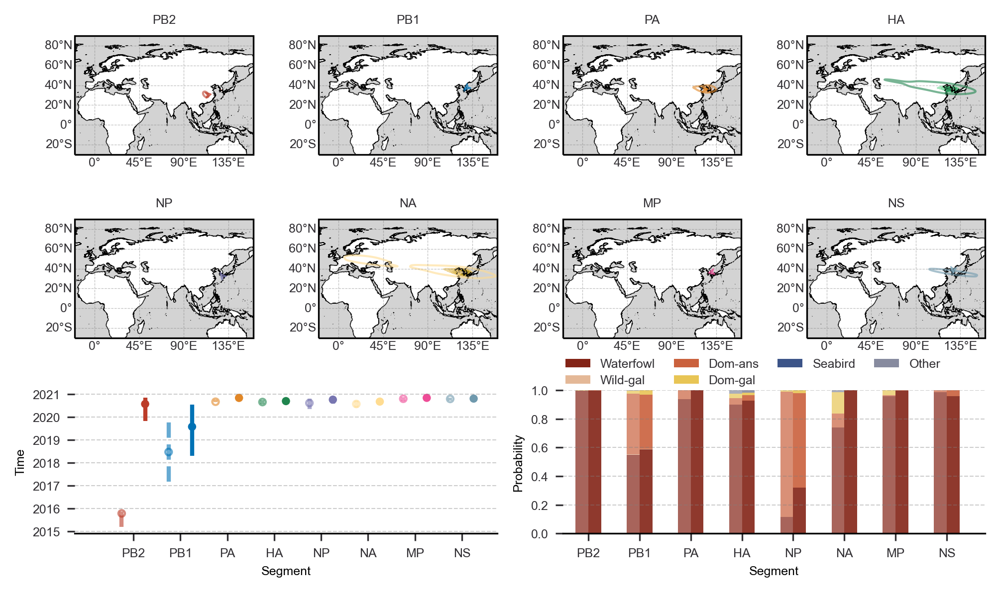

In [220]:
fig = plt.figure(figsize=(6.75, 4.), constrained_layout=False, dpi=300)
gs = fig.add_gridspec(3, 4)
proj = ccrs.PlateCarree()

for i, seg in enumerate(seg_l):
    ax = fig.add_subplot(gs[i // 4, i % 4], projection=proj)
    draw_single_seg_map(ax, seg, loc_estimation_G1R1[seg], color_seg[i], extent=(-20, 160, -30, 90), step=(30, 30))


ax9 = fig.add_subplot(gs[2, 0:2])
draw_time_estimation(ax9, anster_est_G1R1, fontsize=6)

ax10 = fig.add_subplot(gs[2, 2:4])
draw_host_estimation(ax10, anster_est_G1R1, fontsize=6)

# fig.suptitle('Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)', style='italic', weight='bold', fontsize=8)
print('Most Recent Common Ancestor Estimation for %s (%s)' % (group_map[group], group))

plt.tight_layout()
# plt.subplots_adjust(hspace=0.1, wspace=0.4, top=1, left=0.1, right=0.95, bottom=0.1)
plt.savefig(f'./results/G0R2.pdf', dpi=300)

plt.show()

In [23]:
group = "3_2_2_1_2_1_1_2"
_group = group.replace('_', '')

df_l = pd.DataFrame()
loc_estimation_G1R2 = {}
for seg in seg_l:
    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
    acc_of_group = metainfo.query('group == @group').index.to_list()

    t = pd.DataFrame(parse_mcc_tree(treeFile, acc_of_group), columns=['height_m', 'height_l', 'height_u'] + host_set, index=[[seg, seg], ['mrca', 'mrcga']])
    df_l = df_l.append(t)

    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'
    loc_estimation_G1R2[seg] = parse_mcc_tree_set(treeFile, acc_of_group)

anster_est_G1R2 = df_l.unstack(1).reindex(seg_l)
anster_est_G1R2

height_m              height_l              height_u             \
          mrca      mrcga       mrca      mrcga       mrca      mrcga   
PB2 2020-10-01 2020-09-14 2020-06-17 2020-04-27 2020-11-23 2020-11-19   
PB1 2019-06-10 2018-06-21 2018-02-16 2017-03-08 2020-06-04 2019-11-17   
PA  2019-12-11 2019-06-06 2019-03-21 2018-04-13 2020-07-27 2020-04-12   
HA  2020-11-11 2020-10-10 2020-10-16 2020-10-10 2020-11-26 2020-10-10   
NP  2020-07-16 2020-06-08 2020-04-02 2020-02-07 2020-10-09 2020-09-14   
NA  2020-10-31 2020-09-30 2020-09-30 2020-08-22 2020-11-17 2020-10-16   
MP  2020-11-11 2020-10-13 2020-10-18 2020-09-11 2020-12-04 2020-10-20   
NS  2018-08-05 2017-04-17 2017-02-23 2016-07-29 2019-11-13 2017-10-26   

    Waterfowl            Wild-gal             Dom-ans             Dom-gal  \
         mrca     mrcga      mrca     mrcga      mrca     mrcga      mrca   
PB2  0.017827  0.019438  0.000930  0.001250  0.947915  0.939752  0.033328   
PB1  0.551716  0.550828  0.000333  0.001333  0.420287  0.424842  0.027441   
PA   0.008667  0.007110  0.000000  0.000111  0.833667  0.868015  0.157667   
HA   0.576667  0.750000  0.000000  0.000000  0.360000  0.000000  0.063333   
NP   0.092893  0.150761  0.000000  0.000111  0.891371  0.830241  0.015228   
NA   0.630769  0.907173  0.000000  0.000000  0.319231  0.071730  0.050000   
MP   0.169014  0.851852  0.000000  0.000000  0.671362  0.016835  0.159624   
NS   0.908697  0.999430  0.000556  0.000000  0.083407  0.000570  0.006895   

                Seabird               Other            
        mrcga      mrca     mrcga      mrca     mrcga  
PB2  0.039332  0.000000  0.000114  0.000000  0.000114  
PB1  0.021553  0.000000  0.000111  0.000222  0.001333  
PA   0.124431  0.000000  0.000222  0.000000  0.000111  
HA   0.250000  0.000000  0.000000  0.000000  0.000000  
NP   0.017776  0.000000  0.000000  0.000508  0.001111  
NA   0.021097  0.000000  0.000000  0.000000  0.000000  
MP   0.131313  0.000000  0.000000  0.000000  0.000000  
NS   0.000000  0.000111  0.000000  0.000222  0.000000

Most Recent Common Ancestor Estimation for G1R1 (2_2_1_1_2_1_1_1)


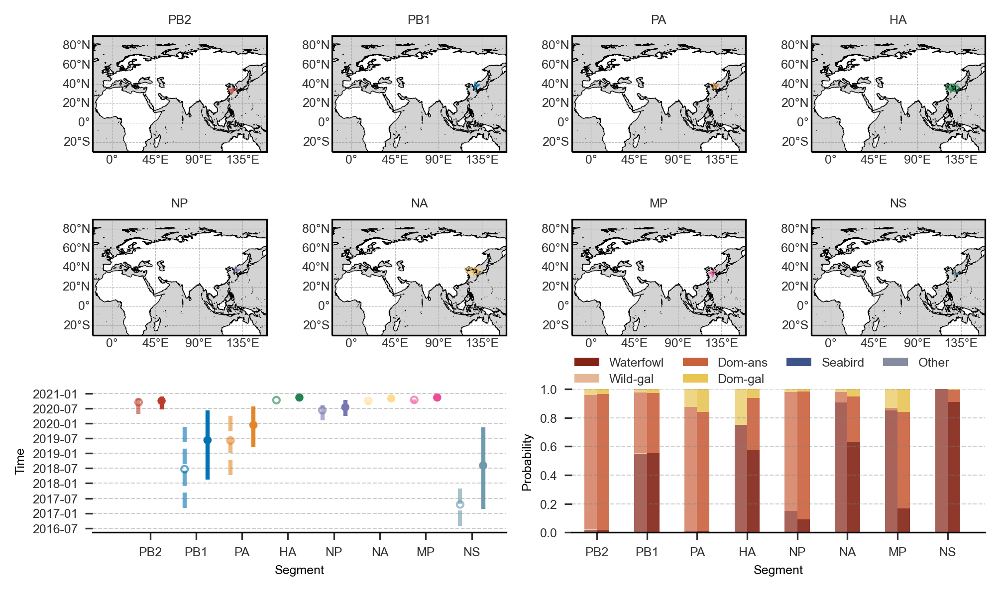

In [219]:
fig = plt.figure(figsize=(6.75, 4.), constrained_layout=False, dpi=300)
gs = fig.add_gridspec(3, 4)
proj = ccrs.PlateCarree()

for i, seg in enumerate(seg_l):
    ax = fig.add_subplot(gs[i // 4, i % 4], projection=proj)
    draw_single_seg_map(ax, seg, loc_estimation_G1R2[seg], color_seg[i], extent=(-20, 160, -30, 90), step=(30, 30))


ax9 = fig.add_subplot(gs[2, 0:2])
draw_time_estimation(ax9, anster_est_G1R2, fontsize=6)

ax10 = fig.add_subplot(gs[2, 2:4])
draw_host_estimation(ax10, anster_est_G1R2, fontsize=6)

# fig.suptitle('Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)', style='italic', weight='bold', fontsize=8)
print('Most Recent Common Ancestor Estimation for %s (%s)' % (group_map[group], group))
plt.tight_layout()
plt.savefig(f'./results/G0R3.pdf', dpi=300)

plt.show()

In [25]:
group = "1_1_1_1_2_1_1_1"
_group = group.replace('_', '')

df_l = pd.DataFrame()
loc_estimation_G1R3 = {}
for seg in seg_l:
    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
    acc_of_group = metainfo.query('group == @group').index.to_list()
    if seg == 'MP':
        acc_of_group.extend(["EPI_ISL_985190"])

    t = pd.DataFrame(parse_mcc_tree(treeFile, acc_of_group), columns=['height_m', 'height_l', 'height_u'] + host_set, index=[[seg, seg], ['mrca', 'mrcga']])
    df_l = df_l.append(t)

    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'
    loc_estimation_G1R3[seg] = parse_mcc_tree_set(treeFile, acc_of_group)

anster_est_G1R3 = df_l.unstack(1).reindex(seg_l)
anster_est_G1R3

height_m              height_l              height_u             \
          mrca      mrcga       mrca      mrcga       mrca      mrcga   
PB2 2020-11-26 2020-11-03 2020-11-04 2020-10-04 2020-12-15 2020-11-19   
PB1 2020-10-26 2020-06-16 2020-08-12 2020-04-11 2020-12-06 2020-08-15   
PA  2020-11-06 2020-10-15 2020-09-20 2020-09-21 2020-12-04 2020-10-20   
HA  2020-12-07 2020-11-27 2020-11-22 2020-11-16 2020-12-21 2020-12-03   
NP  2020-10-25 2020-08-23 2020-07-26 2020-05-14 2020-12-17 2020-11-13   
NA  2020-12-07 2020-11-22 2020-11-23 2020-11-05 2020-12-18 2020-11-27   
MP  2020-11-27 2020-11-14 2020-11-06 2020-10-21 2020-12-08 2020-11-25   
NS  2020-10-16 2020-09-14 2020-09-20 2020-08-05 2020-11-05 2020-10-14   

    Waterfowl           Wild-gal         Dom-ans             Dom-gal  \
         mrca     mrcga     mrca mrcga      mrca     mrcga      mrca   
PB2  0.036667  0.075269        0     0  0.963333  0.924731  0.000000   
PB1  0.006667  0.200000        0     0  0.970000  0.546667  0.023333   
PA   0.322148  1.000000        0     0  0.674497  0.000000  0.003356   
HA   0.094118  0.208333        0     0  0.882353  0.791667  0.023529   
NP   0.008814  0.055882        0     0  0.989395  0.923529  0.001790   
NA   0.113333  0.965517        0     0  0.886667  0.034483  0.000000   
MP   0.006689  0.051282        0     0  0.993311  0.940171  0.000000   
NS   0.986111  0.716981        0     0  0.013889  0.047170  0.000000   

              Seabird       Other            
        mrcga    mrca mrcga  mrca     mrcga  
PB2  0.000000       0     0   0.0  0.000000  
PB1  0.250000       0     0   0.0  0.003333  
PA   0.000000       0     0   0.0  0.000000  
HA   0.000000       0     0   0.0  0.000000  
NP   0.020588       0     0   0.0  0.000000  
NA   0.000000       0     0   0.0  0.000000  
MP   0.008547       0     0   0.0  0.000000  
NS   0.235849       0     0   0.0  0.000000

Most Recent Common Ancestor Estimation for G1R1 (2_2_1_1_2_1_1_1)


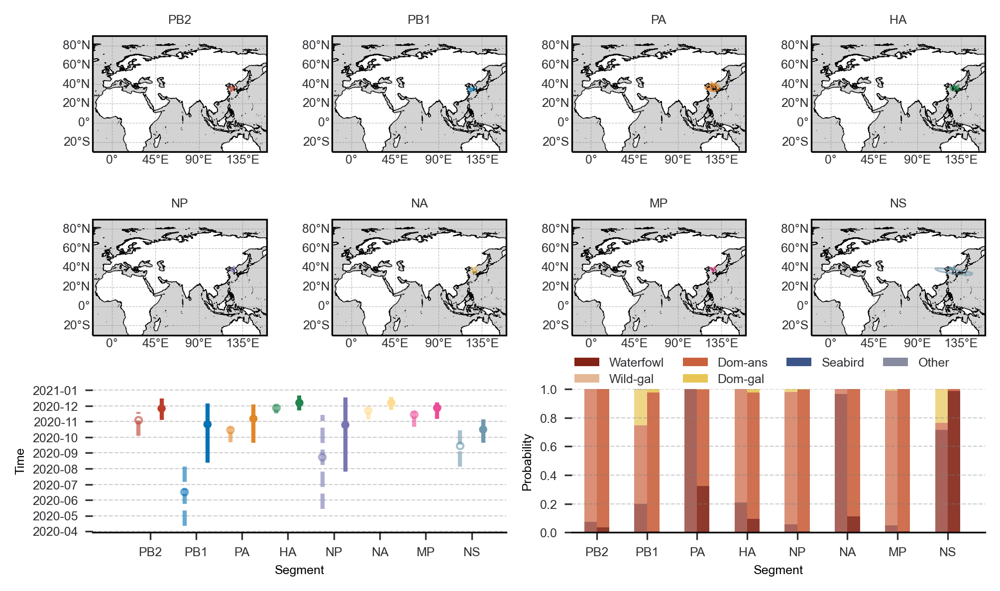

In [217]:
fig = plt.figure(figsize=(6.75, 4.), constrained_layout=False, dpi=300)
gs = fig.add_gridspec(3, 4)
proj = ccrs.PlateCarree()

for i, seg in enumerate(seg_l):
    ax = fig.add_subplot(gs[i // 4, i % 4], projection=proj)
    draw_single_seg_map(ax, seg, loc_estimation_G1R3[seg], color_seg[i], extent=(-20, 160, -30, 90), step=(30, 30))


ax9 = fig.add_subplot(gs[2, 0:2])
draw_time_estimation(ax9, anster_est_G1R3, fontsize=6)

ax10 = fig.add_subplot(gs[2, 2:4])
draw_host_estimation(ax10, anster_est_G1R3, fontsize=6)

# fig.suptitle('Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)', style='italic', weight='bold', fontsize=8)
print('Most Recent Common Ancestor Estimation for %s (%s)' % (group_map[group], group))

plt.tight_layout()
plt.savefig(f'./results/G0R1.pdf', dpi=300)

plt.show()

In [27]:
group = "4_2_3_0_3_2_0_0"
_group = group.replace('_', '')
acc_of_group = metainfo.query('group == @group').index.to_list()

df_l = pd.DataFrame()
loc_estimation_G0R1 = {}
for seg in seg_l:
    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'

    t = pd.DataFrame(parse_mcc_tree(treeFile, acc_of_group), columns=['height_m', 'height_l', 'height_u'] + host_set, index=[[seg, seg], ['mrca', 'mrcga']])
    df_l = df_l.append(t)

    treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'
    loc_estimation_G0R1[seg] = parse_mcc_tree_set(treeFile, acc_of_group)

anster_est_G0R1 = df_l.unstack(1).reindex(seg_l)
anster_est_G0R1

height_m              height_l              height_u             \
          mrca      mrcga       mrca      mrcga       mrca      mrcga   
PB2 2020-09-04 2016-12-11 2020-04-18 2015-12-23 2020-09-19 2017-06-08   
PB1 2020-09-19 2016-09-26 2020-08-31 2016-05-21 2020-09-19 2016-12-15   
PA  2020-08-27 2018-08-21 2020-06-30 2017-04-04 2020-09-19 2019-10-21   
HA  2020-08-08 2020-07-14 2020-05-15 2020-05-06 2020-09-09 2020-08-22   
NP  2020-09-19 2019-05-27 2020-09-02 2018-10-02 2020-09-19 2020-01-07   
NA  2020-09-19 2018-10-02 2020-09-19 2018-09-29 2020-09-19 2018-10-03   
MP  2020-09-06 2020-08-31 2020-09-06 2020-08-31 2020-09-06 2020-08-31   
NS  2020-09-01 2020-03-24 2020-07-28 2020-03-17 2020-09-19 2020-07-13   

    Waterfowl           Wild-gal             Dom-ans             Dom-gal  \
         mrca     mrcga     mrca     mrcga      mrca     mrcga      mrca   
PB2  0.001111  0.999583      0.0  0.000000  0.000000  0.000000  0.998889   
PB1  0.000000  0.368201      0.0  0.003569  0.000000  0.466158  0.999889   
PA   0.000444  0.933452      0.0  0.000222  0.000000  0.000444  0.999556   
HA   0.076370  0.272277      0.0  0.000000  0.012129  0.016089  0.911500   
NP   0.000111  0.968781      0.0  0.000111  0.000000  0.000444  0.999889   
NA   0.000000  0.952005      0.0  0.000555  0.000000  0.039662  1.000000   
MP   0.000000  0.000000      0.0  0.000000  0.000000  0.000000  1.000000   
NS   0.018331  0.264706      0.0  0.000000  0.000444  0.000000  0.981224   

              Seabird           Other            
        mrcga    mrca     mrcga  mrca     mrcga  
PB2  0.000417     0.0  0.000000   0.0  0.000000  
PB1  0.066453     0.0  0.068915   0.0  0.024366  
PA   0.064215     0.0  0.000222   0.0  0.001333  
HA   0.710396     0.0  0.000000   0.0  0.001238  
NP   0.028775     0.0  0.000444   0.0  0.001444  
NA   0.002222     0.0  0.000111   0.0  0.005333  
MP   1.000000     0.0  0.000000   0.0  0.000000  
NS   0.735294     0.0  0.000000   0.0  0.000000

Most Recent Common Ancestor Estimation for G1R1 (2_2_1_1_2_1_1_1)


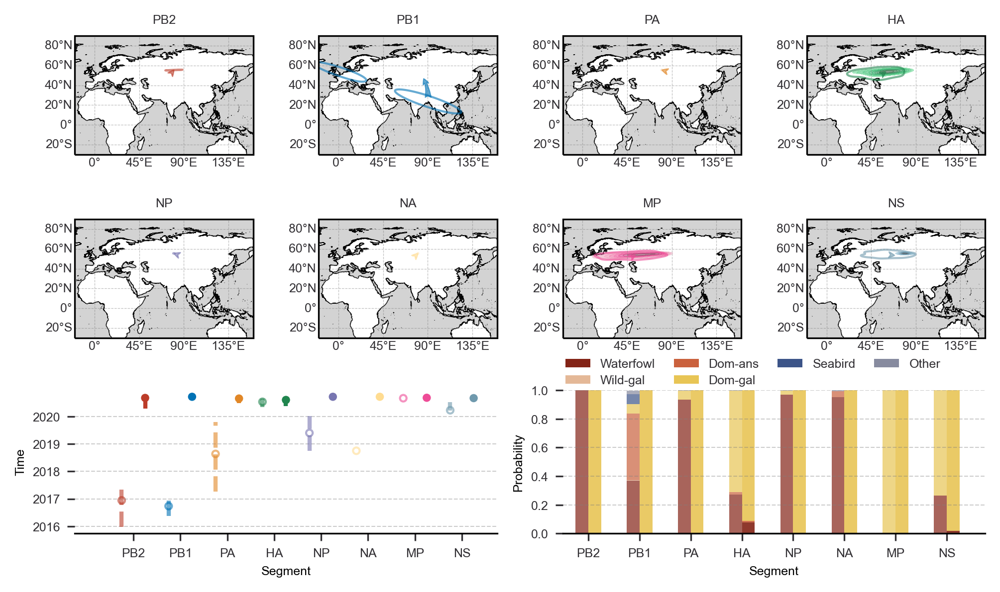

In [216]:
fig = plt.figure(figsize=(6.75, 4.), constrained_layout=False, dpi=300)
gs = fig.add_gridspec(3, 4)
proj = ccrs.PlateCarree()

for i, seg in enumerate(seg_l):
    ax = fig.add_subplot(gs[i // 4, i % 4], projection=proj)
    draw_single_seg_map(ax, seg, loc_estimation_G0R1[seg], color_seg[i], extent=(-20, 160, -30, 90), step=(30, 30))


ax9 = fig.add_subplot(gs[2, 0:2])
draw_time_estimation(ax9, anster_est_G0R1, fontsize=6)

ax10 = fig.add_subplot(gs[2, 2:4])
draw_host_estimation(ax10, anster_est_G0R1, fontsize=6)

# plt.subplots_adjust(hspace=0.2, top=0.9, wspace=0.3)
# fig.suptitle('Most Recent Common Ancestor Estimation for G1noR (1_1_1_1_1_1_1_1)', style='italic', weight='bold', fontsize=8)
print('Most Recent Common Ancestor Estimation for %s (%s)' % (group_map[group], group))

plt.tight_layout()
plt.savefig(f'./results/G1R1.pdf', dpi=300)

plt.show()

| Genotype | group annotation |
| --- | --- |
|G1noR | 1_1_1_1_1_1_1_1 |  
|G1R1 | 2_2_1_1_2_1_1_1  |
|G1R2 | 3_2_2_1_2_1_1_2  |
|G1R3 | 1_1_1_1_2_1_1_1  |
|G0noR | 0_0_0_0_0_0_0_0  |
|G0R1 | 4_2_3_0_3_2_0_0  |


In [221]:
def addPercentBar(self, ax, target=None, x_attr=None, y_attr=None, values=None, width=.6, bar_height=1, **kwargs):
    if target == None: target = lambda k: k.is_leaf()
    if x_attr == None: x_attr = lambda k: k.x
    if y_attr == None: y_attr = lambda k: k.y
    if values == None: values = lambda k: k.name
    for k in filter(target, self.Objects):
        x, y = x_attr(k), y_attr(k)
        x = x - width/2
        ratios = k.traits['host2.set.prob']
        names = k.traits['host2.set']
        bottom = y - bar_height/2
        for name, ratio in zip(names, ratios):
            height = ratio * bar_height
            ax.bar(x, height, width, bottom=bottom, color=host_cmap.get(name, '#000000'), linewidth=0., edgecolor='black', **kwargs)
            bottom += height
    return ax

In [222]:
group_cmap

{'G1': '#832316',
 'G1R1': '#ca613d',
 'G1R2': '#e8c555',
 'G1R3': '#e4b897',
 'G1other': '#878b9f',
 'G0': '#3C5488',
 'G0R1': '#a9b8a2',
 'G0other': '#878b9f'}

In [223]:
def draw_tree(ax, ll, internal_node_set):
    mst = ll.mostRecent
    y_span = ll.ySpan
    x_span = ll.treeHeight

    ### set node location and branch color
    x_attr = lambda k: k.absoluteTime
    c_func = lambda k: host_cmap[k.traits['host2']]

    ll.plotTree(ax, x_attr=x_attr, colour=c_func, width=2, alpha=.8)
    ll.plotPoints(ax, x_attr=x_attr, colour=c_func, size=16, zorder=100, outline=False)

    ### set tip name
    target_func=lambda k: k.is_leaf()
    text_func = lambda k: "{:10}  {}  {}".format(metainfo.loc[k.name, 'Subtype'], metainfo.loc[k.name, 'Isolate_Name'], metainfo.loc[k.name, 'group2'])
    text_x_attr=lambda k: mst + .25
    color_func = lambda k: group_cmap.get(metainfo.loc[k.name, 'group2'], 'dimgrey')
    kwargs={'va':'center','ha':'left','fontsize': 5} ## kwargs for text

    y_attr=lambda k: k.y

    for k in filter(target_func, ll.Objects):
        x,y=text_x_attr(k),y_attr(k)
        ax.text(x,y,text_func(k),color=color_func(k),zorder=4,**kwargs)

    ### and grey lines from every tip's date to the most recent date
    for k in ll.getExternal(): ## iterate over tips
        ax.plot([k.absoluteTime, ll.mostRecent + .2], [k.y, k.y], ls='--', lw=.5, color='dimgrey')

    ### add percent bar chart on internal node
    target_func=lambda k: k.is_node() and k in internal_node_set
    bar_x_attr=lambda k: k.absoluteTime
    bar_y_attr=lambda k: k.y
    values_func=lambda k: k.traits['host2.set.prob']

    addPercentBar(ll, ax, width=x_span/12, bar_height=y_span/12, x_attr=bar_x_attr, y_attr=bar_y_attr, values=values_func, target=target_func)

    ### set tMRCA
    target_func=lambda k: k.is_node() and k in internal_node_set
    text_func = lambda k: "{:s}\n[{:s}, {:s}]".format(bt.calendarDate(mst - k.traits['height']), 
                                                      bt.calendarDate(mst - k.traits['height_95%_HPD'][1]), 
                                                      bt.calendarDate(mst - k.traits['height_95%_HPD'][0]))
    text_x_attr=lambda k: k.absoluteTime-0.1
    text_y_attr=lambda k: k.y-0.2
    kwargs={'va':'top','ha':'right','size': 6} ## kwargs for text

    ll.addText(ax,x_attr=text_x_attr,y_attr=text_y_attr,target=target_func,text=text_func,color='dimgrey', **kwargs)

    ax.set_ylim(-1,ll.ySpan+1)
    ax.set_yticks([])
    ax.set_yticklabels([])
    
    [ax.spines[loc].set_visible(False) for loc in ax.spines if loc not in ['bottom']]

    ax.grid(axis='x', ls='--', lw=0.3)

    ### add legend
    handles = []
    for host, color in host_cmap.items(): 
        handles.append(mpatches.Patch(color=color, label=host, alpha=1))
    plt.legend(handles=handles, frameon=False, loc='lower left', fontsize=6)


In [224]:
def draw_small_map(ax, extend, loc_, gloc_, states=False, river=False, border=False):
    
    ax.set_extent(extent, crs=proj)
    gl = ax.gridlines(draw_labels=True, crs=proj, linestyle='--', linewidth=.5, color='dimgrey', alpha=.6)
    gl.top_labels = False
    gl.right_labels = False
    ax.add_feature(cfeature.COASTLINE.with_scale('10m'), lw=0.3)

    if river == True:
        ax.add_feature(cfeature.RIVERS.with_scale('10m'), edgecolor='lightblue', lw=.3)
    if states == True:
        ax.add_feature(cfeature.STATES.with_scale('10m'), lw=0.3)
    if border == True:
        ax.add_feature(cfeature.BORDERS.with_scale('10m'), lw=0.3)

    long, lat = zip(*loc_)
    glong, glat = zip(*gloc_)
    ax.annotate('', xy=(np.median(lat), np.median(long)), xytext=(np.median(glat), np.median(glong)),
                transform=proj, 
                arrowprops=dict(arrowstyle='fancy', connectionstyle="arc3,rad=0.2", alpha=0.6, shrinkB=5, linewidth=.0, color='C0'))
    sns.kdeplot(x=lat, y=long, fill=True, thresh=0.1, ax=ax, transform=proj, levels=2, alpha=.6 ,color='C0')
    sns.kdeplot(x=glat, y=glong, fill=False, thresh=0.1, ax=ax, transform=proj, levels=2, alpha=.6, linewidths=.8, color='C0')

#     [ax.spines[loc].set_visible(False) for loc in ax.spines]

In [226]:
trans_group = {'G0noR': 'G1',
               'G1noR': 'G0',
               'G1R1': 'G0R2',
               'G1R2': 'G0R3',
               'G1R3': 'G0R1',
               'G0R1': 'G1R1',
               'G1other': 'G0other',
               'G0other': 'G1other',}

In [227]:
metainfo['group2'] = metainfo['group2'].map(lambda x: trans_group.get(x, ''))

In [240]:
group_l = ['G0', 'G0R2', 'G0R3', 'G0R1', 'G0other', 'G1', 'G1R1', 'G1other']
color_l = ['#832316', '#ca613d', '#e8c555', '#e4b897', '#878b9f', '#3C5488', '#a9b8a2', '#878b9f']
group_cmap = dict(zip(group_l, color_l))

Figure size: 6 x 2.8125


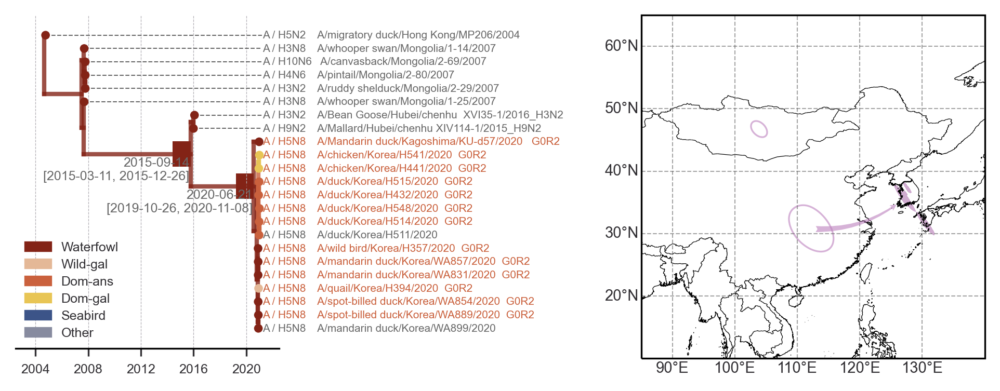

In [241]:
## read beast analysis results
group = '2_2_1_1_2_1_1_1'
_group = group.replace('_', '')
seg = 'PB2'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []
acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)

ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)

# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {6} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 4))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

figure_height = 7.5 * (ll.ySpan + 4) / 72

extent = (85, 140, 10, 65)
loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.15)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G1R1 PB2***

Figure size: 6 x 5.3125


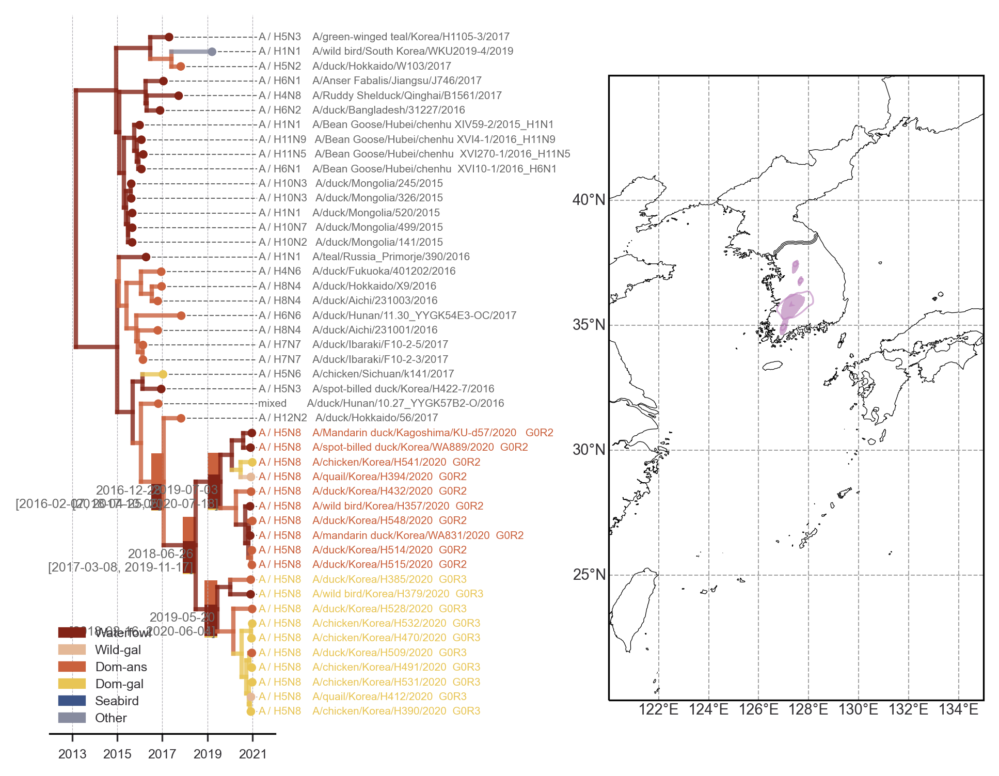

In [242]:
## read beast analysis results
group = '2_2_1_1_2_1_1_1'
_group = group.replace('_', '')
seg = 'PB1'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []

acc_of_group = metainfo.query('group2 in ["G0R3", "G0R2"]').index.to_list()
acc_set.append(acc_of_group)

acc_of_group = metainfo.query('group2 == "G0R3"').index.to_list()
acc_set.append(acc_of_group)

acc_of_group = metainfo.query('group2 == "G0R2"').index.to_list()
acc_set.append(acc_of_group)


ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {6} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 2))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

# extent = (-20, 150, -20, 90)
# extent = (40, 135, 10, 80)
# extent = (80, 135, 20, 55)
extent = (120, 135, 20, 45)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.2)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G1R1 G1R2 PB1***

Figure size: 6 x 5.520833333333333


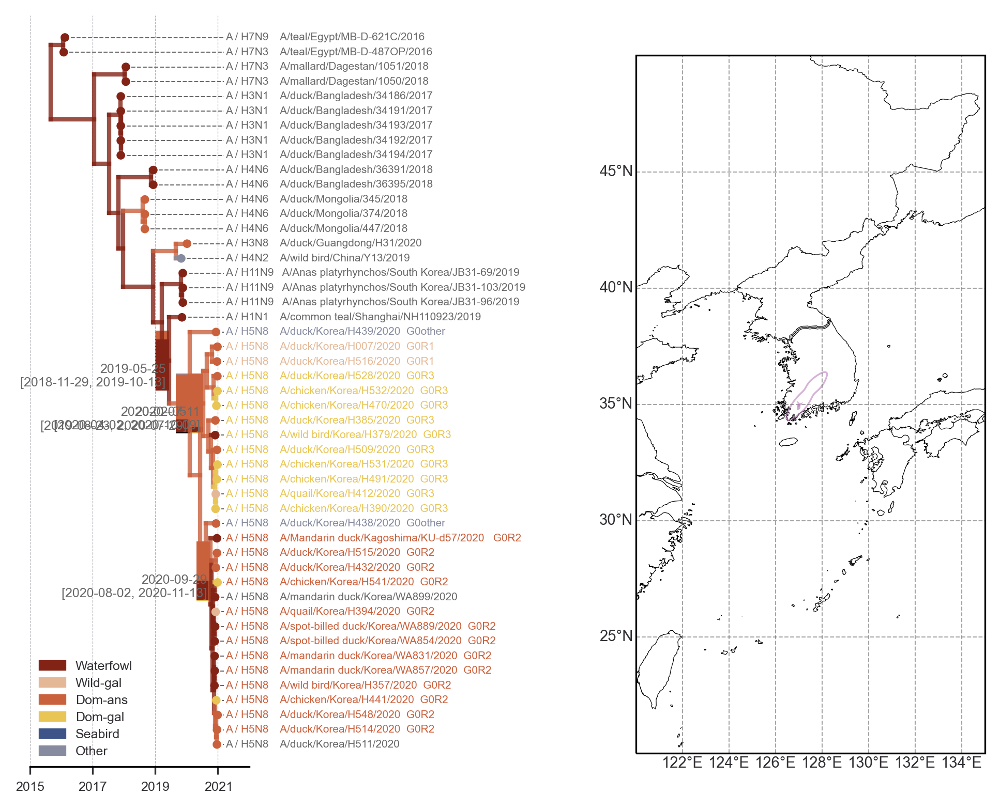

In [243]:
## read beast analysis results
group = '2_2_1_1_2_1_1_1'
_group = group.replace('_', '')
seg = 'NP'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []

acc_of_group = metainfo.query('group2 in ["G0R3", "G0R2", "G0other"]').index.to_list()
acc_set.append(acc_of_group)

acc_of_group = metainfo.query('group2 == "G0R3"').index.to_list()
acc_set.append(acc_of_group)

acc_of_group = metainfo.query('group2 == "G0R2"').index.to_list()
acc_set.append(acc_of_group)

ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {6} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 2))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

extent = (120, 135, 20, 50)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.3)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G1R1 G1R2 G1R3 NP***

Figure size: 6 x 2.3958333333333335


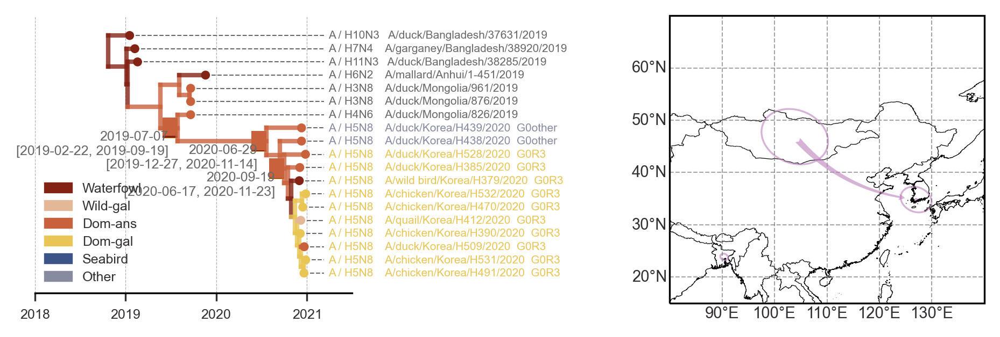

In [244]:
## read beast analysis results
group = '3_2_2_1_2_1_1_2'
_group = group.replace('_', '')
seg = 'PB2'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []
acc_of_group = metainfo.query('group2 in ["G0R3", "G0other"]').index.to_list()
acc_set.append(acc_of_group)

acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)


ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {6} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 1))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

# extent = (-20, 150, -20, 90)
# extent = (40, 135, 10, 80)
# extent = (80, 135, 20, 55)
extent = (80, 140, 15, 70)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.1)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G1R2 PB2***

Figure size: 6 x 2.7083333333333335


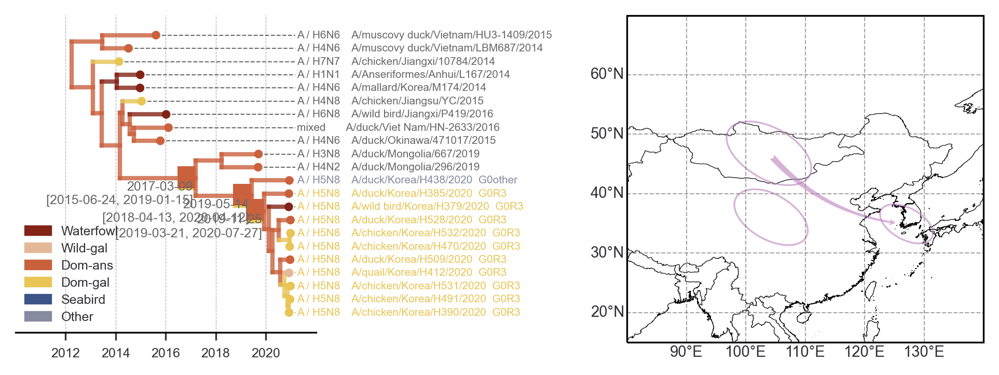

In [245]:
## read beast analysis results
group = '3_2_2_1_2_1_1_2'
_group = group.replace('_', '')
seg = 'PA'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []
acc_of_group = metainfo.query('group2 in ["G0R3", "G0other"]').index.to_list()
acc_set.append(acc_of_group)

acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)

ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {6} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 2))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

# extent = (-20, 150, -20, 90)
# extent = (40, 135, 10, 80)
extent = (80, 140, 15, 70)
# extent = (122.5, 132.5, 30, 40)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.1)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G1R2 PA***

Figure size: 6 x 3.0208333333333335


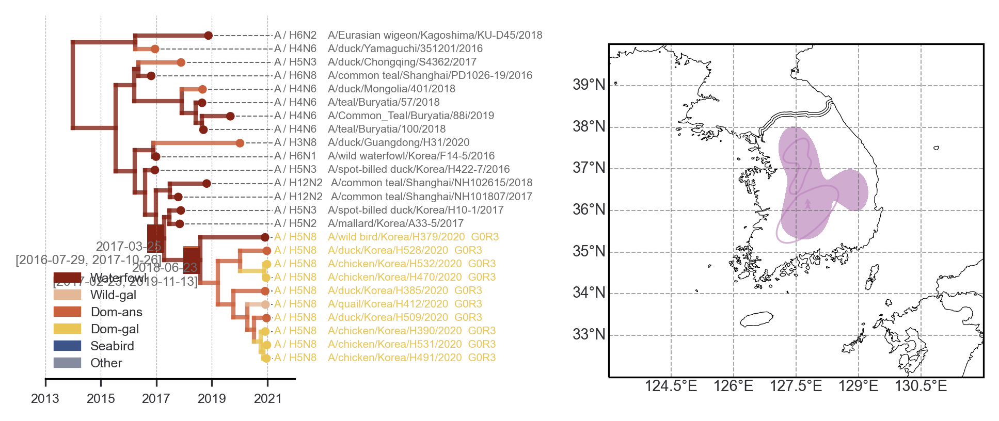

In [246]:
## read beast analysis results
group = '3_2_2_1_2_1_1_2'
_group = group.replace('_', '')
seg = 'NS'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []

acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)

ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {6} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 2))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

# extent = (-20, 150, -20, 90) # Eurasian + Africa
# extent = (40, 135, 10, 80)
# extent = (80, 135, 20, 55)  # East Asia
extent = (123, 132, 32, 40) # Sounth Korea

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.2)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G1R2 NS***

Figure size: 6 x 3.3333333333333335


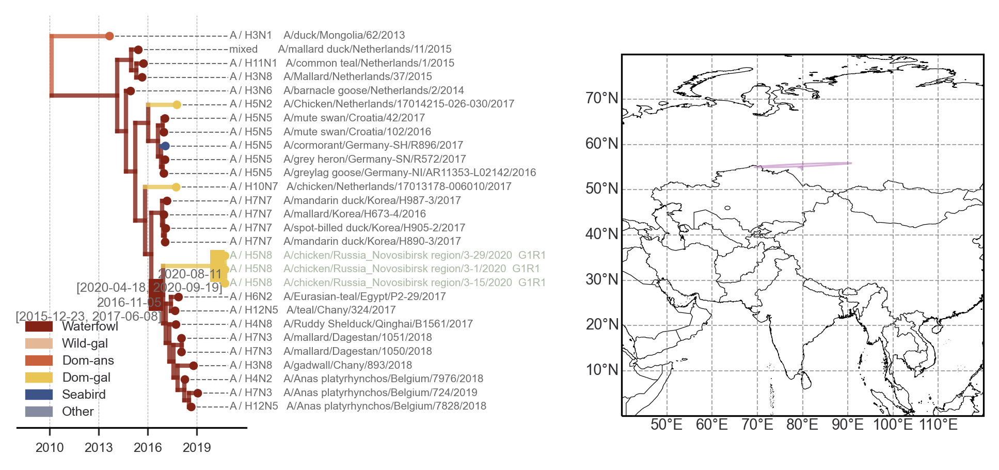

In [247]:
## read beast analysis results
group = '4_2_3_0_3_2_0_0'
_group = group.replace('_', '')
seg = 'PB2'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []
# acc_of_group = metainfo.query('group2 in ["G1R2", "G1other"]').index.to_list()
# acc_set.append(acc_of_group)

acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)

ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {6} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 3))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

# extent = (-20, 150, -20, 90)
extent = (40, 120, 0, 80)
# extent = (80, 135, 20, 55)
# extent = (122.5, 132.5, 30, 40)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.25)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G0R1 PB2***

Figure size: 7 x 3.2291666666666665


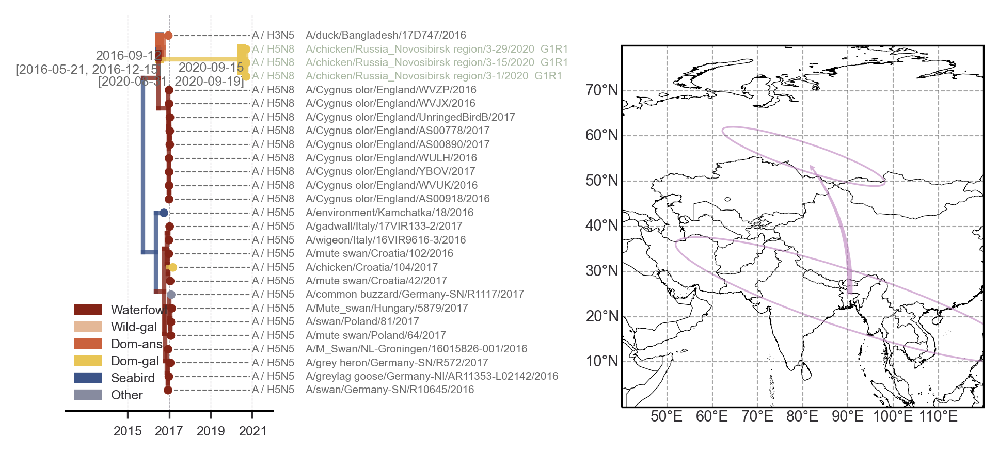

In [248]:
## read beast analysis results
group = '4_2_3_0_3_2_0_0'
_group = group.replace('_', '')
seg = 'PB1'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []

acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)


ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {7} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
plt.xlim(2012, 2022)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 2))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

extent = (40, 120, 0, 80)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.25)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G0R1 PB1***

Figure size: 7 x 4.0625


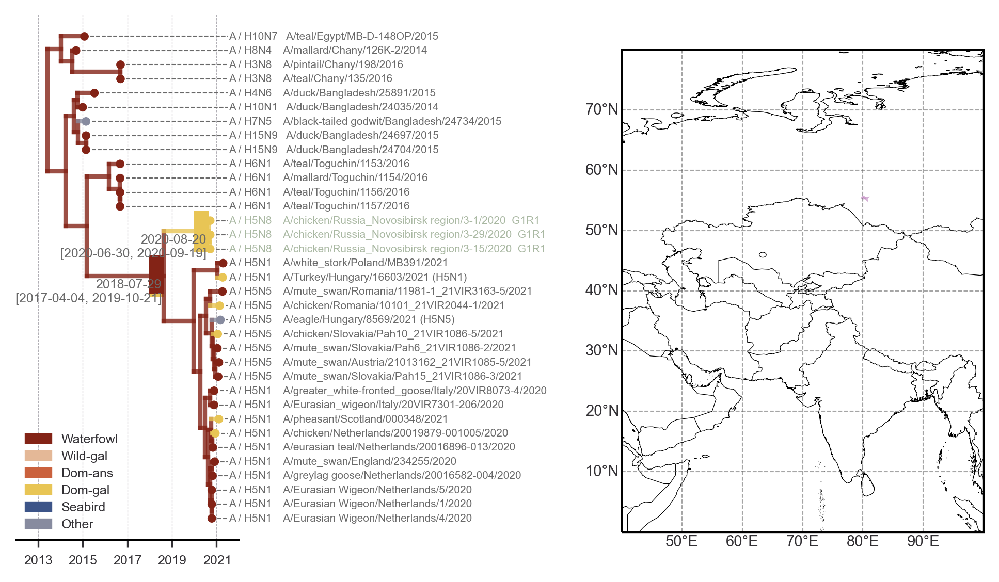

In [249]:
## read beast analysis results
group = '4_2_3_0_3_2_0_0'
_group = group.replace('_', '')
seg = 'PA'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []

acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)


ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)
print(f"Figure size: {7} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
# plt.xlim(2012, 2022)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 2))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

extent = (40, 100, 0, 80)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.25)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G0R1 PA***

Figure size: 4 x 3.3333333333333335


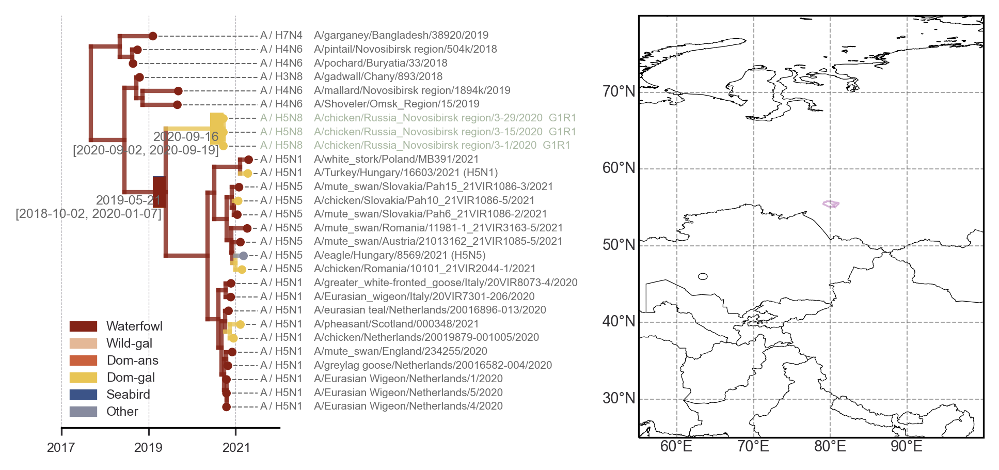

In [250]:
## read beast analysis results
group = '4_2_3_0_3_2_0_0'
_group = group.replace('_', '')
seg = 'NP'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []

acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)


ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)

print(f"Figure size: {4} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
# plt.xlim(2012, 2022)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 2))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

extent = (55, 100, 25, 80)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.2)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G0R1 NP***

Figure size: 4 x 3.4375


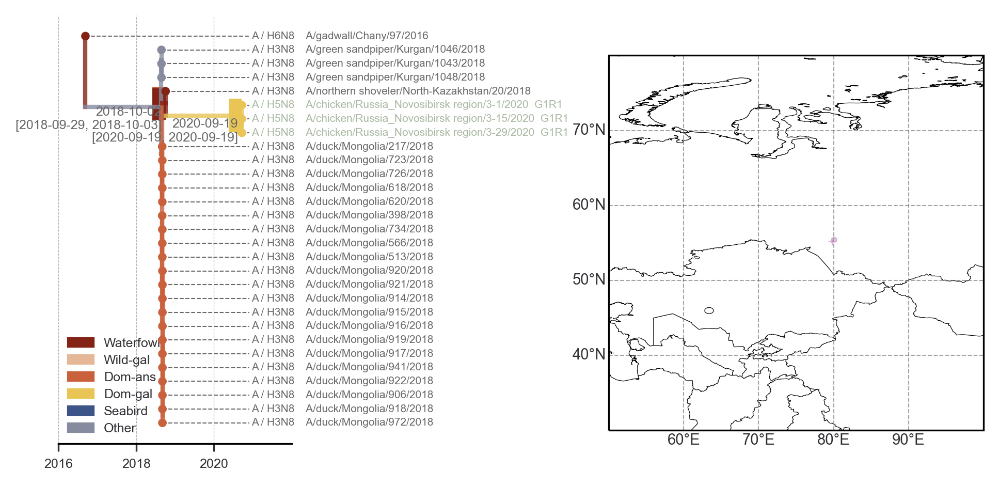

In [251]:
## read beast analysis results
group = '4_2_3_0_3_2_0_0'
_group = group.replace('_', '')
seg = 'NA'

treeFile = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.mcc.tree'
treeFile2 = f'./data/03_beast_analysis/group{_group}/ext_{beast_map[group][seg]}_{seg}.resample.trees'

acc_set = []

acc_of_group = metainfo.query('group == @group').index.to_list()
acc_set.append(acc_of_group)


ll = bt.loadNexus(treeFile, variableDate=True, absoluteTime=False, verbose=False)
ll.sortBranches(descending=True)
mst_acc = max([(l.name, l.height) for l in ll.getExternal()], key=lambda x: x[1])[0]
mst = bt.decimalDate(metainfo.loc[mst_acc, 'Collection_Date'])
ll.setAbsoluteTime3(mst)


# fetch internal nodes for given acc set
internal_node_set = []
for i, acc_l in enumerate(acc_set):
    acc_inter = [l for l in ll.getExternal() if l.name in acc_l]
    if len(acc_inter) > 1:
        mrca = ll.commonAncestor(acc_inter)
    else:
        mrca = acc_inter[0].parent

    if i == 0:
        internal_node_set.append(mrca.parent)
    internal_node_set.append(mrca)


## draw phylo tree
fig = plt.figure(figsize=(6.75, 7.5 * (ll.ySpan + 4) / 72), facecolor='w', dpi=300, constrained_layout=True)

print(f"Figure size: {4} x {7.5 * (ll.ySpan + 4) / 72}")

ax = fig.add_subplot(121)

draw_tree(ax, ll, internal_node_set)
# plt.xlim(2012, 2022)
plt.xticks(ticks=np.arange(np.floor(ll.root.absoluteTime), 2022, 2))

proj = ccrs.PlateCarree()
ax = fig.add_subplot(122, projection=proj)

extent = (50, 100, 30, 80)

loc_, gloc_ = parse_mcc_tree_set(treeFile2, acc_set[0])
draw_small_map(ax, extent, loc_, gloc_, river=False, border=True, states=False)

fig.set_constrained_layout_pads(w_pad=18 / 72, h_pad=18 / 72, hspace=0.,  wspace=0.2)

plt.savefig(f'./results/{group_map[group]}_{seg}.pdf', dpi=300)
plt.show()

***G0R1 NA***

# 